In [3]:
#hide
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

In [4]:
#hide
from fastbook import *
from fastai.vision.widgets import *

In [5]:
key = os.environ.get('AZURE_SEARCH_KEY', 'b5527b9aa21242cb9e18e11d456a97c3')

In [6]:
search_images_bing

<function fastbook.search_images_bing>

In [7]:
results = search_images_bing(key, 'chris pratt')
ims = results.attrgot('contentUrl')
len(ims)

150

In [8]:
dest = 'pratt.jpg'
download_url(ims[0], dest)

In [10]:
chris_types = 'pratt','pine','evans','hemsworth'
path = Path('chris')

In [11]:
if not path.exists():
    path.mkdir()
    for o in chris_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_bing(key, f'chris {o}')
        download_images(dest, urls=results.attrgot('contentUrl'))

In [12]:
fns = get_image_files(path)
fns

(#491) [Path('chris/evans/00000110.jpg'),Path('chris/evans/00000137.jpg'),Path('chris/evans/00000134.jpg'),Path('chris/evans/00000091.jpg'),Path('chris/evans/00000010.jpg'),Path('chris/evans/00000107.jpg'),Path('chris/evans/00000093.jpg'),Path('chris/evans/00000117.jpg'),Path('chris/evans/00000089.jpg'),Path('chris/evans/00000051.jpg')...]

In [13]:
failed = verify_images(fns)
failed

(#0) []

In [14]:
failed.map(Path.unlink);

In [24]:
chriss = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [25]:
dls = chriss.dataloaders(path)

In [26]:
chriss = chriss.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = chriss.dataloaders(path)

In [27]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,2.357994,1.600945,0.602041,01:11


epoch,train_loss,valid_loss,error_rate,time
0,1.761804,1.411482,0.510204,01:27
1,1.456447,1.201943,0.448980,01:28
2,1.237534,1.098335,0.387755,01:27
3,1.090928,1.051663,0.336735,01:28


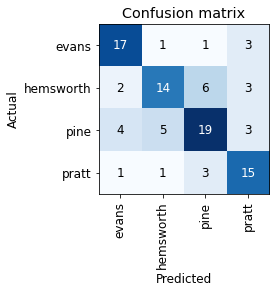

In [28]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

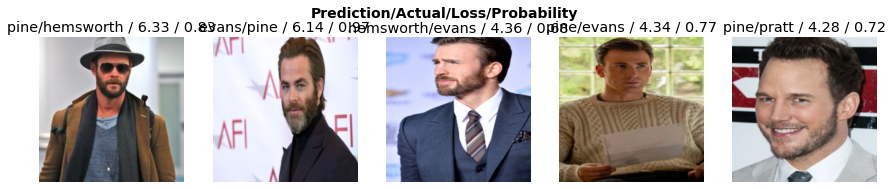

In [29]:
interp.plot_top_losses(5, nrows=1)

In [21]:
#hide_output
cleaner = ImageClassifierCleaner(learn)
cleaner

In [22]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

In [30]:
learn.export()

In [31]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [32]:
learn_inf = load_learner(path/'export.pkl')

In [39]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [42]:
btn_upload = SimpleNamespace(data = ['pratt.jpg'])

In [43]:
img = PILImage.create(btn_upload.data[-1])

In [44]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))
out_pl

Output()

In [49]:
pred,pred_idx,probs = learn_inf.predict(img)

In [50]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: pratt; Probability: 0.6378')

In [51]:
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [52]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [53]:
btn_upload = widgets.FileUpload()

In [54]:
VBox([widgets.Label('Select your Chris!'), 
      btn_upload, btn_run, out_pl, lbl_pred])

In [50]:
!pip install voila
!jupyter serverextension enable --sys-prefix voila 

     |████████████████████████████████| 1.6MB 7.8MB/s 
     |████████████████████████████████| 399kB 37.5MB/s 
     |████████████████████████████████| 552kB 37.6MB/s 
     |████████████████████████████████| 122kB 40.7MB/s 
     |████████████████████████████████| 71kB 9.8MB/s 
     |████████████████████████████████| 430kB 44.5MB/s 
     |████████████████████████████████| 81kB 11.2MB/s 
ERROR: nbdev 1.1.14 has requirement nbconvert<6, but you'll have nbconvert 6.1.0 which is incompatible.
ERROR: google-colab 1.0.0 has requirement tornado~=5.1.0; python_version >= "3.0", but you'll have tornado 6.1 which is incompatible.
  Found existing installation: tornado 5.1.1
    Uninstalling tornado-5.1.1:
      Successfully uninstalled tornado-5.1.1
  Found existing installation: jupyter-client 5.3.5
    Uninstalling jupyter-client-5.3.5:
      Successfully uninstalled jupyter-client-5.3.5
  Found existing installation: nbconvert 5.6.1
    Uninstalling nbconvert-5.6.1:
      Successfully uninstall

Enabling: voila
- Writing config: /usr/etc/jupyter
    - Validating...
Error loading server extension voila
      X is voila importable?
